<a href="https://colab.research.google.com/github/kinkaid002/Fish-species-detection-and-identification-using-YOLOv5/blob/main/Copy_of_YOLOv5l_Fish.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14106, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 14106 (delta 83), reused 106 (delta 69), pack-reused 13982
Receiving objects: 100% (14106/14106), 13.30 MiB | 4.58 MiB/s, done.
Resolving deltas: 100% (9740/9740), done.


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="btE4f7kMowhuBbaL23lB")
project = rf.workspace("school-xfuun").project("fish-combined")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 178 kB 22.9 MB/s 
     |████████████████████████████████| 1.1 MB 61.3 MB/s 
     |████████████████████████████████| 54 kB 2.3 MB/s 
     |████████████████████████████████| 138 kB 69.1 MB/s 
     |████████████████████████████████| 145 kB 72.6 MB/s 
     |████████████████████████████████| 67 kB 7.1 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=e1a9100724f975ad12dd9e0be28906420303fa9bd2c10cbea9395e658ba7f552
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: cer

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Fish-combined-1 in yolov5pytorch:: 100%|██████████| 4648/4648 [00:01<00:00, 2651.50it/s]


In [ ]:
!pip install -r yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 14.4 MB/s 


In [ ]:
with open('new_train_yaml', 'w+') as file:
    file.write(
        """# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 6  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]
"""
    )

In [ ]:
with open('new_data_yaml', 'w+') as file:
    file.write(
        """
        train: /content/Fish-combined-1/train
        val: /content/Fish-combined-1/valid

        nc: 6
        names: ['Amnitaba_caudivittatus','Caranx','Caranx_sexfasciatus_juvenile','acanthopagrus_palmaris','gerres','lutjanus_johnii']
        """
    )

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 8 --epochs 150 --patience 300 --data /content/new_data_yaml --cfg /content/new_train_yaml

train: weights=yolov5/yolov5s.pt, cfg=/content/new_train_yaml, data=/content/new_data_yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=300, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t

In [ ]:
!ls /content/yolov5/runs/train

exp


In [ ]:
!zip -r /content/runs.zip /content/yolov5/runs/train
import shutil
colab_link = "/content/runs.zip"
gdrive_link = "/content/drive/MyDrive/"
shutil.copy(colab_link, gdrive_link)

  adding: content/yolov5/runs/train/ (stored 0%)
  adding: content/yolov5/runs/train/exp/ (stored 0%)
  adding: content/yolov5/runs/train/exp/confusion_matrix.png (deflated 21%)
  adding: content/yolov5/runs/train/exp/val_batch1_pred.jpg (deflated 13%)
  adding: content/yolov5/runs/train/exp/F1_curve.png (deflated 7%)
  adding: content/yolov5/runs/train/exp/results.csv (deflated 83%)
  adding: content/yolov5/runs/train/exp/P_curve.png (deflated 9%)
  adding: content/yolov5/runs/train/exp/events.out.tfevents.1665909838.cc508b42e09e.351.0 (deflated 39%)
  adding: content/yolov5/runs/train/exp/val_batch2_pred.jpg (deflated 14%)
  adding: content/yolov5/runs/train/exp/val_batch1_labels.jpg (deflated 13%)
  adding: content/yolov5/runs/train/exp/opt.yaml (deflated 50%)
  adding: content/yolov5/runs/train/exp/PR_curve.png (deflated 12%)
  adding: content/yolov5/runs/train/exp/val_batch0_pred.jpg (deflated 12%)
  adding: content/yolov5/runs/train/exp/train_batch0.jpg (deflated 7%)
  adding: co

'/content/drive/MyDrive/runs.zip'

In [ ]:
import glob
from IPython.display import Image, display

!python /content/yolov5/detect.py --source '/content/Fish-combined-1/test/images/*.jpg' --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.30 --save-txt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/Fish-combined-1/test/images/*.jpg, data=yolov5/data/coco128.yaml, imgsz=[416, 416], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
new_train_yaml summary: 267 layers, 46135203 parameters, 0 gradients, 107.7 GFLOPs
image 1/173 /content/Fish-combined-1/test/images/7117_Caranx_sexfasciatus_juvenile_f000007_jpg.rf.10e764a1bdcf61c6632172ca67ce810b.jpg: 416x416 8 Caranx_sexfasciatus_juveniles, 30.5ms
image 2/173 /content/Fish-combined-1/test/images/7117_Caranx_sexfasciatus_juvenile_f000009_jpg.rf.cd

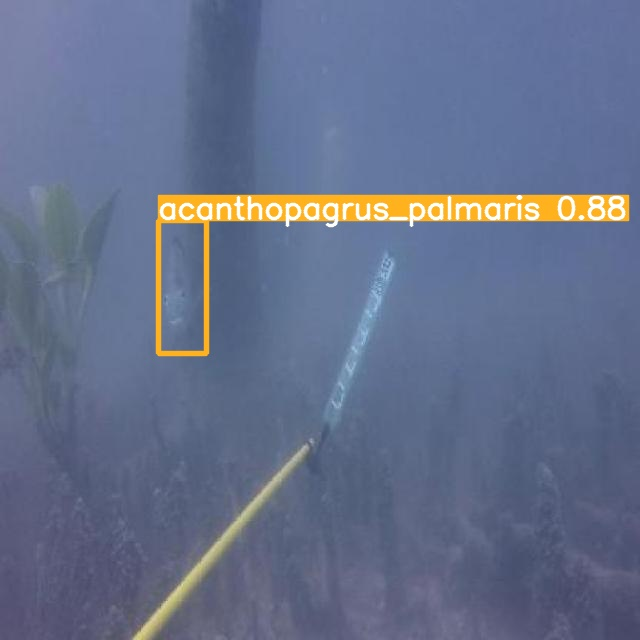

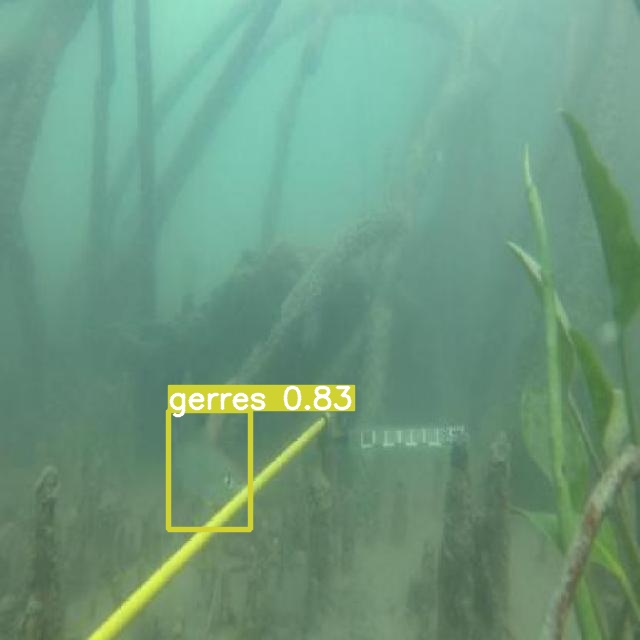

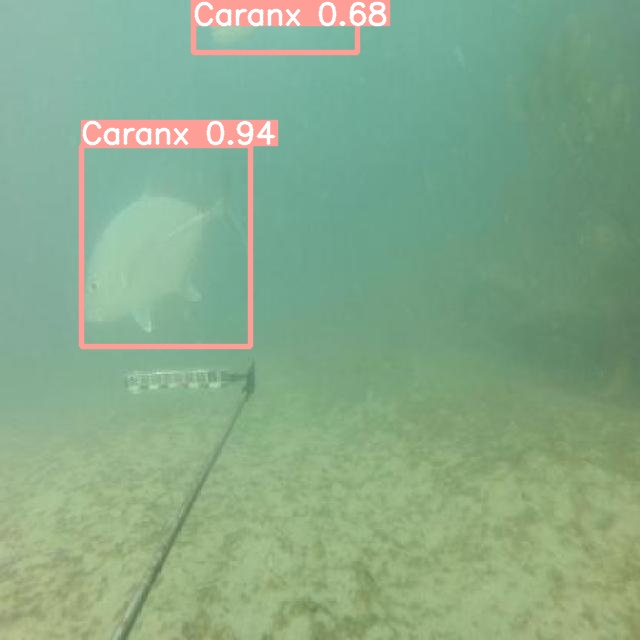

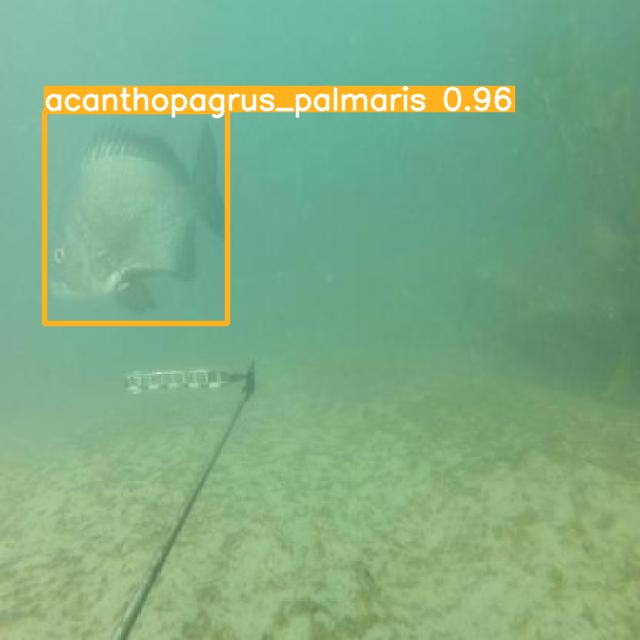

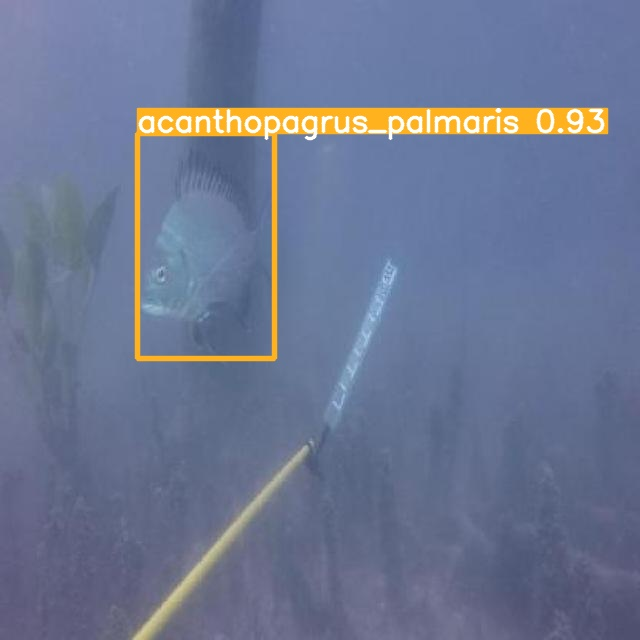

...

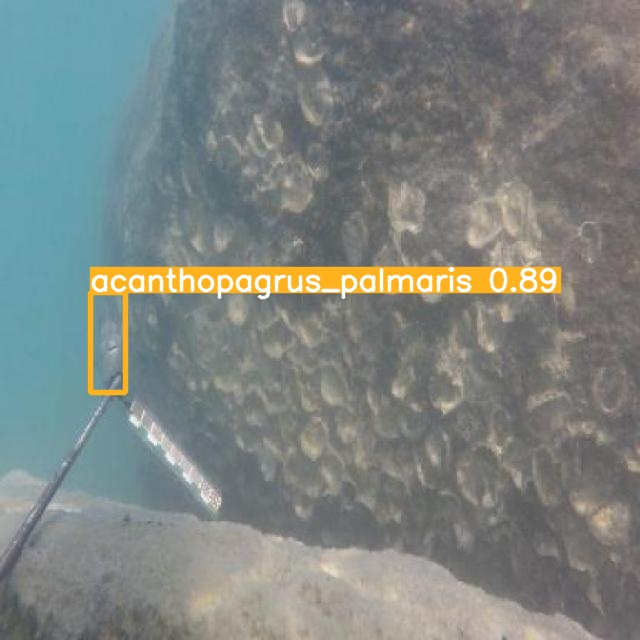

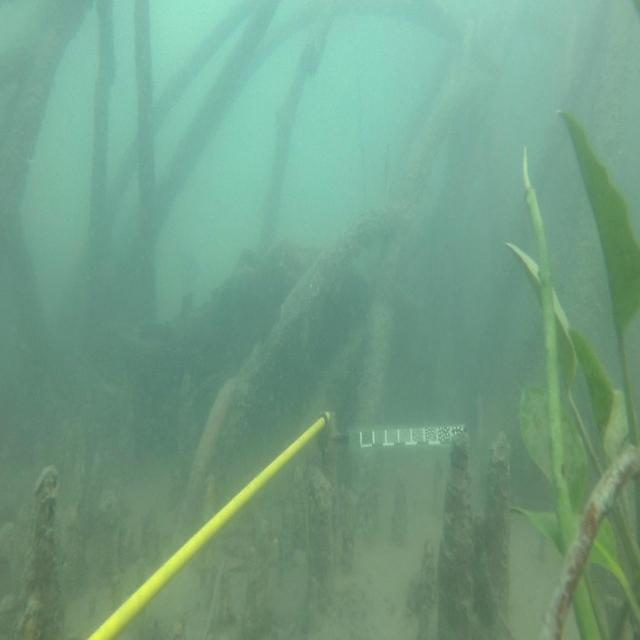

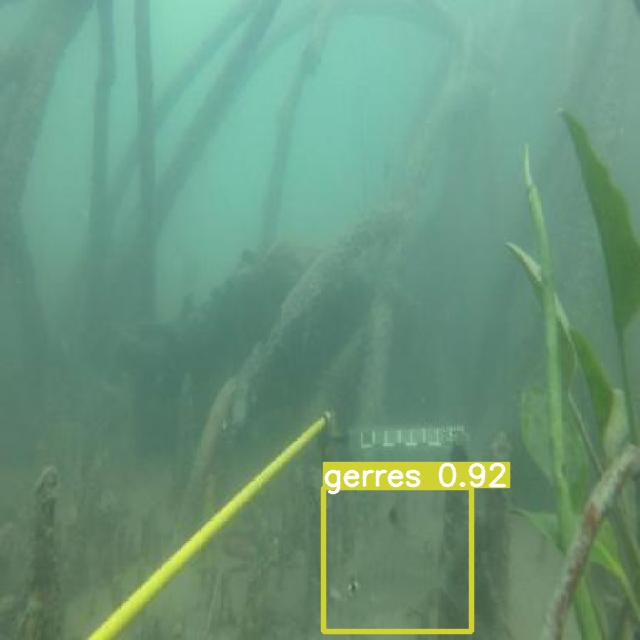

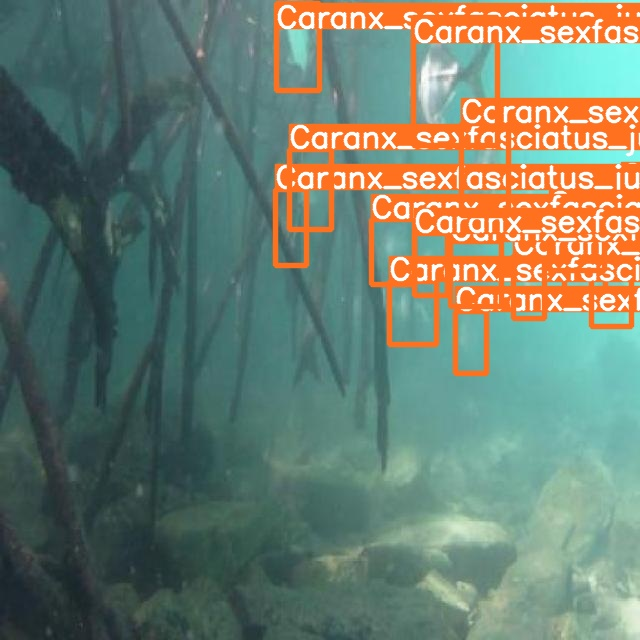

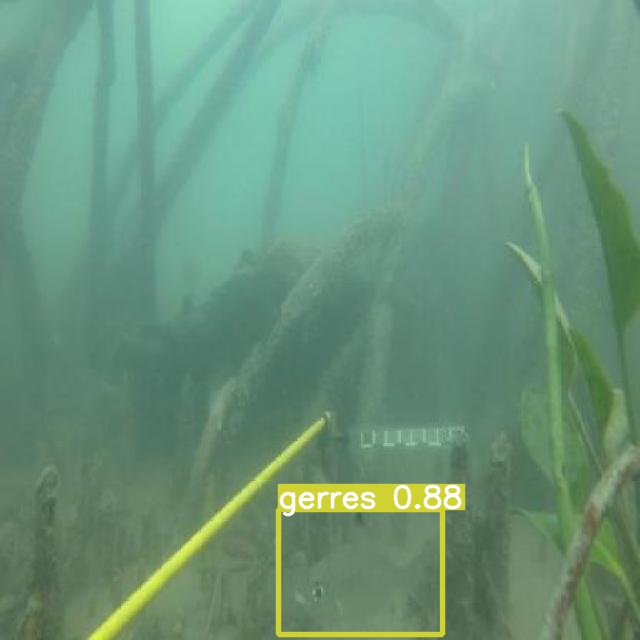

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")